# Section 25: Complete Data Science Project with Multiple Linear Regression

## Objectives
- Repeat the Mod 1 Project analysis in a streamlined way.

- Learn about `pandas_profiling` for quick and easy EDA (don't use on Mod Projects please).

- Intro to the idea of pipelines / programmatic construction of models

- Learn about [Variance Inflation Factor](https://etav.github.io/python/vif_factor_python.html) and how to use it to address multicollinearity. ( [Wikipedia: VIF](https://en.wikipedia.org/wiki/Variance_inflation_factor))




### Questions?
- Checking for normality and what to do about it.
- Checking how much scaling affects the output

### Follow Ups
- Question regarding removal high VIF variables and if the others that were identified as high VIF would still be high after removing an initial VIF>5.

**Work Tracker (How long did the project take me?):**
- Start: 12/10/19 ~8:45pm 
- End: 12/10/19 11:00 pm

# OBTAIN

In [1]:
!pip install -U fsds_100719
from fsds_100719.imports import *

fsds_1007219  v0.4.45 loaded.  Read the docs: https://fsds.readthedocs.io/en/latest/ 


Handle,Package,Description
dp,IPython.display,Display modules with helpful display and clearing commands.
fs,fsds_100719,Custom data science bootcamp student package
mpl,matplotlib,Matplotlib's base OOP module with formatting artists
plt,matplotlib.pyplot,Matplotlib's matlab-like plotting module
np,numpy,scientific computing with Python
pd,pandas,High performance data structures and tools
sns,seaborn,High-level data visualization library based on matplotlib


In [2]:
import scipy.stats as stats
import statsmodels.api as sms
import statsmodels.formula.api as smf

from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score

import pandas_profiling

In [3]:
# Set pandas options
pd.set_option('display.precision',3)
pd.set_option('display.max_columns',0)

# Filter warnings
import warnings
warnings.filterwarnings('ignore')

In [4]:
df = fs.datasets.load_mod1_proj()
df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,10/13/2014,221900.0,3,1.00,1180,5650,1.0,NaN,0.0,3,7,1180,0.0,1955,0.0,98178,47.511,-122.257,1340,5650
1,6414100192,12/9/2014,538000.0,3,2.25,2570,7242,2.0,0.0,0.0,3,7,2170,400.0,1951,1991.0,98125,47.721,-122.319,1690,7639
2,5631500400,2/25/2015,180000.0,2,1.00,770,10000,1.0,0.0,0.0,3,6,770,0.0,1933,NaN,98028,47.738,-122.233,2720,8062
3,2487200875,12/9/2014,604000.0,4,3.00,1960,5000,1.0,0.0,0.0,5,7,1050,910.0,1965,0.0,98136,47.521,-122.393,1360,5000
4,1954400510,2/18/2015,510000.0,3,2.00,1680,8080,1.0,0.0,0.0,3,8,1680,0.0,1987,0.0,98074,47.617,-122.045,1800,7503


In [5]:
pandas_profiling.ProfileReport(df)

# SCRUB / EXPLORE

In [6]:
drop_cols =['id','date','view']

df.drop(drop_cols, axis=1,inplace=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 18 columns):
price            21597 non-null float64
bedrooms         21597 non-null int64
bathrooms        21597 non-null float64
sqft_living      21597 non-null int64
sqft_lot         21597 non-null int64
floors           21597 non-null float64
waterfront       19221 non-null float64
condition        21597 non-null int64
grade            21597 non-null int64
sqft_above       21597 non-null int64
sqft_basement    21597 non-null object
yr_built         21597 non-null int64
yr_renovated     17755 non-null float64
zipcode          21597 non-null int64
lat              21597 non-null float64
long             21597 non-null float64
sqft_living15    21597 non-null int64
sqft_lot15       21597 non-null int64
dtypes: float64(7), int64(10), object(1)
memory usage: 3.0+ MB


In [7]:
## Replacing Values
repl_dict = {'sqft_basement':('?','0.0')}

for col,replace in repl_dict.items():
    df[col] = df[col].replace(replace[0], replace[1])
    display(df[col].value_counts())

0.0       13280
600.0       217
500.0       209
700.0       208
800.0       201
          ...  
1284.0        1
65.0          1
792.0         1
243.0         1
20.0          1
Name: sqft_basement, Length: 303, dtype: int64

In [8]:
## Recasting datatypes
recast_dict = {'sqft_basement':'float'}
for col,dtype in recast_dict.items():
    df[col] = df[col].astype(dtype)
df.dtypes

price            float64
bedrooms           int64
bathrooms        float64
sqft_living        int64
sqft_lot           int64
floors           float64
waterfront       float64
condition          int64
grade              int64
sqft_above         int64
sqft_basement    float64
yr_built           int64
yr_renovated     float64
zipcode            int64
lat              float64
long             float64
sqft_living15      int64
sqft_lot15         int64
dtype: object

In [9]:
## Fill Null values / zeros
fillna_dict = {'waterfront':0,
              'yr_renovated':0}

for col,val in fillna_dict.items():
    df[col].fillna(val,inplace=True)
    

In [10]:
pandas_profiling.ProfileReport(df)

# Model 

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.826
Model:                            OLS   Adj. R-squared:                  0.825
Method:                 Least Squares   F-statistic:                     1084.
Date:                Thu, 12 Dec 2019   Prob (F-statistic):               0.00
Time:                        14:32:08   Log-Likelihood:            -2.8852e+05
No. Observations:               21597   AIC:                         5.772e+05
Df Residuals:                   21502   BIC:                         5.780e+05
Df Model:                          94                                         
Covariance Type:            nonrobust                                         
=======================================================================================
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
Intercept           -3.527e+07   5.89e+06     -5.992      0.000   -4.68e+07   -2.37e+07
C(grade)[T.4]       -8.643e+04   1.57e+05     -0.551      0.582   -3.94e+05    2.21e+05
C(grade)[T.5]       -1.285e+05   1.54e+05     -0.833      0.405   -4.31e+05    1.74e+05
C(grade)[T.6]        -1.33e+05   1.54e+05     -0.863      0.388   -4.35e+05    1.69e+05
C(grade)[T.7]       -1.294e+05   1.54e+05     -0.840      0.401   -4.31e+05    1.73e+05
C(grade)[T.8]       -1.011e+05   1.54e+05     -0.656      0.512   -4.03e+05    2.01e+05
C(grade)[T.9]        -2.12e+04   1.54e+05     -0.138      0.891   -3.23e+05    2.81e+05
C(grade)[T.10]       1.055e+05   1.54e+05      0.684      0.494   -1.97e+05    4.08e+05
C(grade)[T.11]       3.099e+05   1.55e+05      2.006      0.045    7087.513    6.13e+05
C(grade)[T.12]        7.34e+05   1.55e+05      4.726      0.000     4.3e+05    1.04e+06
C(grade)[T.13]       1.857e+06   1.61e+05     11.564      0.000    1.54e+06    2.17e+06
C(zipcode)[T.98002]  1.954e+04   1.38e+04      1.411      0.158   -7597.494    4.67e+04
C(zipcode)[T.98003]  -1.38e+04   1.24e+04     -1.115      0.265   -3.81e+04    1.05e+04
C(zipcode)[T.98004]  7.084e+05   2.25e+04     31.497      0.000    6.64e+05    7.52e+05
C(zipcode)[T.98005]   2.51e+05    2.4e+04     10.440      0.000    2.04e+05    2.98e+05
C(zipcode)[T.98006]  2.281e+05   1.97e+04     11.604      0.000     1.9e+05    2.67e+05
C(zipcode)[T.98007]  2.123e+05   2.48e+04      8.556      0.000    1.64e+05    2.61e+05
C(zipcode)[T.98008]  2.465e+05   2.36e+04     10.463      0.000       2e+05    2.93e+05
C(zipcode)[T.98010]   1.09e+05   2.11e+04      5.162      0.000    6.76e+04     1.5e+05
C(zipcode)[T.98011]  5.913e+04   3.07e+04      1.929      0.054    -949.718    1.19e+05
C(zipcode)[T.98014]  1.218e+05   3.37e+04      3.615      0.000    5.57e+04    1.88e+05
C(zipcode)[T.98019]  8.272e+04   3.32e+04      2.490      0.013    1.76e+04    1.48e+05
C(zipcode)[T.98022]  9.188e+04   1.83e+04      5.008      0.000    5.59e+04    1.28e+05
C(zipcode)[T.98023]  -5.43e+04   1.14e+04     -4.768      0.000   -7.66e+04    -3.2e+04
C(zipcode)[T.98024]  1.875e+05   2.96e+04      6.327      0.000    1.29e+05    2.46e+05
C(zipcode)[T.98027]  1.662e+05   2.02e+04      8.235      0.000    1.27e+05    2.06e+05
C(zipcode)[T.98028]  5.335e+04   2.98e+04      1.792      0.073   -5010.943    1.12e+05
C(zipcode)[T.98029]   2.27e+05   2.31e+04      9.844      0.000    1.82e+05    2.72e+05
C(zipcode)[T.98030]  9808.6736   1.36e+04      0.721      0.471   -1.69e+04    3.65e+04
C(zipcode)[T.98031]   1.04e+04   1.42e+04      0.733      0.464   -1.74e+04    3.82e+04
C(zipcode)[T.98032] -1.196e+04   1.65e+04     -0.727      0.467   -4.42e+04    2.03e+04
C(zipcode)[T.98033]  3.093e+05   2.55e+04     12.109      0.000    2.59e+05    3.59e+05
C(z

(<Figure size 720x360 with 2 Axes>,
 array([<matplotlib.axes._subplots.AxesSubplot object at 0x12c09e0b8>,
       dtype=object))

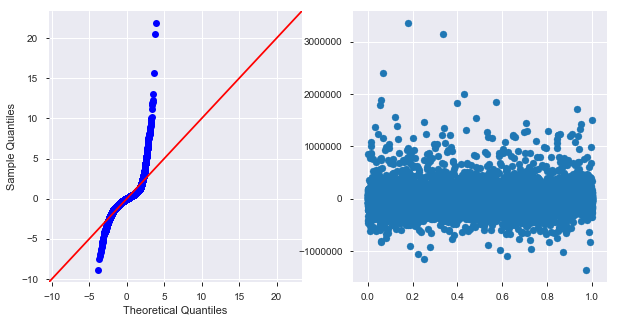

In [11]:
def make_ols_f(df,target='price',cat_cols = ['zipcode','grade'],
               col_list=None, show_summary=True,exclude_cols=[]):
    
    if col_list is None:
        col_list = list(df.drop(target,axis=1).columns)
        
    ## remove exclude cols
    [col_list.remove(ecol) for ecol in exclude_cols if ecol in col_list]

    features = '+'.join(col_list)


    for col in cat_cols:
        features = features.replace(col,f"C({col})")



    formula = target+'~'+features #target~predictors

    model = smf.ols(formula=formula, data=df).fit()
    
    if show_summary:
        display(model.summary())

    return model

## diagnostic function

def diagnose_model(model):
    resids = model.resid
    
    fig,ax = plt.subplots(ncols=2,figsize=(10,5))
    sms.qqplot(resids, stats.distributions.norm,
              fit=True, line='45',ax=ax[0])
    xs = np.linspace(0,1,len(resids))
    ax[1].scatter(x=xs,y=resids)
    
    return fig,ax 

model = make_ols_f(df)
diagnose_model(model)

# Interpret

- How does our model look? 
    - Clearly have not addressed normality 
        - First apply outlier removal  
        - Then try logging as a follow up
        
- What haven't we addressed yet?
    - Multicollinearity

# Revised Model 

In [12]:
def find_outliers_Z(df,col):
    """Use scipy to calcualte absoliute Z-scores 
    and return boolean series where True indicates it is an outlier
    Args:
        col (Series): a series/column from your DataFrame
    Returns:
        idx_outliers (Series): series of  True/False for each row in col
        
    Ex:
    >> idx_outs = find_outliers(df['bedrooms'])
    >> df_clean = df.loc[idx_outs==False]"""
    from scipy import stats

    col = df[col]
    z = np.abs(stats.zscore(col))
    idx_outliers = np.where(z>3,True,False)
    return idx_outliers

def find_outliers_IQR(df,col):
    res = df[col].describe()
    IQR = res['75%'] -  res['25%']
    lower_limit = res['25%'] - 1.5*IQR
    upper_limit = res['75%'] + 1.5*IQR
    
    idx_goodvals = (df[col]<upper_limit) & (df[col]>lower_limit) 
    
    return ~idx_goodvals

In [13]:
idx_outliers_z = find_outliers_Z(df,'bedrooms')
# idx_outliers.sum()
idx_outliers_z.sum()

62

In [14]:
idx_outliers_IQR = find_outliers_IQR(df,'bedrooms')
# idx_outliers.sum()
idx_outliers_IQR.sum()

530

In [15]:
df_outliers_Z = pd.DataFrame()
df_outliers_IQR = pd.DataFrame()

for col in df.columns:
    df_outliers_Z[col] = find_outliers_Z(df,col)
    df_outliers_IQR[col] = find_outliers_IQR(df,col)

idx_outs_IQR = df_outliers_IQR.any(axis=1)
idx_outs_z= df_outliers_Z.any(axis=1)

In [16]:
print(idx_outs_z.sum()/len(idx_outs_z)*100)
print(idx_outs_IQR.sum()/len(idx_outs_IQR)*100)


10.742232717507061
100.0


In [17]:
#drop zscore outleirs
df.loc[idx_outs_z==True].describe()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
count,2.320e+03,2320.000,2320.000,2320.000,2.320e+03,2320.000,2320.000,2320.000,2320.000,2320.000,2320.000,2320.000,2320.000,2320.000,2320.000,2320.000,2320.000,2320.000
mean,9.642e+05,3.743,2.679,3030.356,5.841e+04,1.592,0.063,3.295,8.502,2512.585,508.111,1967.155,640.074,98069.389,47.556,-122.146,2508.857,43113.620
std,7.590e+05,1.353,1.087,1485.212,1.130e+05,0.522,0.243,0.661,1.754,1273.768,683.151,31.634,931.826,51.857,0.127,0.203,1008.541,72303.379
min,7.800e+04,1.000,0.750,410.000,1.024e+03,1.000,0.000,1.000,3.000,410.000,0.000,1900.000,0.000,98001.000,47.156,-122.519,399.000,1026.000
25%,4.450e+05,3.000,2.000,1850.000,7.622e+03,1.000,0.000,3.000,7.000,1530.000,0.000,1943.750,0.000,98028.000,47.479,-122.300,1690.000,7500.000
50%,7.249e+05,4.000,2.500,2840.000,1.359e+04,2.000,0.000,3.000,8.000,2220.000,0.000,1972.000,0.000,98053.000,47.572,-122.196,2330.000,12251.500
75%,1.280e+06,4.000,3.500,4050.000,4.408e+04,2.000,0.000,4.000,10.000,3330.000,982.500,1995.000,1986.000,98112.000,47.647,-122.022,3160.000,36921.500
max,7.700e+06,33.000,8.000,13540.000,1.651e+06,3.500,1.000,5.000,13.000,9410.000,4820.000,2015.000,2015.000,98199.000,47.777,-121.315,6210.000,871200.000


In [18]:
df =df.loc[idx_outs_z ==False]
df.describe()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
count,1.928e+04,19277.000,19277.000,19277.000,19277.000,19277.000,19277.0,19277.000,19277.000,19277.000,19277.000,19277.000,19277.0,19277.000,19277.000,19277.000,19277.000,19277.000
mean,4.893e+05,3.329,2.048,1965.985,9886.432,1.482,0.0,3.424,7.556,1701.464,258.951,1971.462,0.0,98078.982,47.561,-122.222,1923.769,9104.998
std,2.402e+05,0.850,0.691,746.519,11489.925,0.541,0.0,0.648,1.037,708.365,392.312,29.058,0.0,53.618,0.140,0.129,605.730,8958.255
min,8.200e+04,1.000,0.500,370.000,520.000,1.000,0.0,2.000,5.000,370.000,0.000,1900.000,0.0,98001.000,47.176,-122.502,460.000,651.000
25%,3.150e+05,3.000,1.500,1400.000,5000.000,1.000,0.0,3.000,7.000,1170.000,0.000,1952.000,0.0,98033.000,47.469,-122.331,1470.000,5000.000
50%,4.365e+05,3.000,2.250,1852.000,7378.000,1.000,0.0,3.000,7.000,1510.000,0.000,1975.000,0.0,98072.000,47.572,-122.240,1800.000,7453.000
75%,6.070e+05,4.000,2.500,2430.000,9933.000,2.000,0.0,4.000,8.000,2100.000,500.000,1997.000,0.0,98118.000,47.681,-122.135,2280.000,9608.000
max,1.640e+06,6.000,4.250,4750.000,137214.000,3.000,0.0,5.000,11.000,4270.000,1600.000,2015.000,0.0,98199.000,47.778,-121.797,4042.000,93825.000


# Revised Model 2

**Work Tracker (How long did the project take me?):**
- Start: 12/10/19 ~8:45pm 
- End: 12/10/19 11:00 pm

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.828
Model:                            OLS   Adj. R-squared:                  0.827
Method:                 Least Squares   F-statistic:                     1046.
Date:                Thu, 12 Dec 2019   Prob (F-statistic):               0.00
Time:                        14:32:09   Log-Likelihood:            -2.4924e+05
No. Observations:               19277   AIC:                         4.987e+05
Df Residuals:                   19188   BIC:                         4.994e+05
Df Model:                          88                                         
Covariance Type:            nonrobust                                         
=======================================================================================
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
Intercept           -2.364e+07   5.26e+06     -4.494      0.000    -3.4e+07   -1.33e+07
C(grade)[T.6]        7498.2246   7451.703      1.006      0.314   -7107.767    2.21e+04
C(grade)[T.7]        2.748e+04   7352.129      3.737      0.000    1.31e+04    4.19e+04
C(grade)[T.8]        6.787e+04   7693.116      8.822      0.000    5.28e+04     8.3e+04
C(grade)[T.9]        1.552e+05   8285.474     18.737      0.000    1.39e+05    1.71e+05
C(grade)[T.10]       2.358e+05   9150.662     25.764      0.000    2.18e+05    2.54e+05
C(grade)[T.11]       3.413e+05   1.22e+04     28.021      0.000    3.17e+05    3.65e+05
C(zipcode)[T.98002]  2.166e+04   9360.051      2.314      0.021    3311.727       4e+04
C(zipcode)[T.98003] -2782.8218   8235.132     -0.338      0.735   -1.89e+04    1.34e+04
C(zipcode)[T.98004]  5.862e+05   1.65e+04     35.560      0.000    5.54e+05    6.18e+05
C(zipcode)[T.98005]  3.129e+05   1.74e+04     17.978      0.000    2.79e+05    3.47e+05
C(zipcode)[T.98006]  2.759e+05   1.46e+04     18.845      0.000    2.47e+05    3.05e+05
C(zipcode)[T.98007]  2.497e+05    1.8e+04     13.867      0.000    2.14e+05    2.85e+05
C(zipcode)[T.98008]  2.582e+05   1.75e+04     14.731      0.000    2.24e+05    2.93e+05
C(zipcode)[T.98010]  1.218e+05    1.7e+04      7.154      0.000    8.84e+04    1.55e+05
C(zipcode)[T.98011]  1.207e+05    2.2e+04      5.495      0.000    7.77e+04    1.64e+05
C(zipcode)[T.98014]  1.584e+05   2.64e+04      6.006      0.000    1.07e+05     2.1e+05
C(zipcode)[T.98019]  1.222e+05   2.58e+04      4.738      0.000    7.17e+04    1.73e+05
C(zipcode)[T.98022]   6.56e+04    1.5e+04      4.379      0.000    3.62e+04     9.5e+04
C(zipcode)[T.98023] -3.924e+04   8012.077     -4.898      0.000   -5.49e+04   -2.35e+04
C(zipcode)[T.98024]  1.931e+05   2.56e+04      7.541      0.000    1.43e+05    2.43e+05
C(zipcode)[T.98027]  2.138e+05   1.59e+04     13.421      0.000    1.83e+05    2.45e+05
C(zipcode)[T.98028]  1.117e+05   2.12e+04      5.277      0.000    7.02e+04    1.53e+05
C(zipcode)[T.98029]  2.508e+05   1.83e+04     13.677      0.000    2.15e+05    2.87e+05
C(zipcode)[T.98030]  1.512e+04   9438.326      1.602      0.109   -3384.329    3.36e+04
C(zipcode)[T.98031]  2.049e+04   9919.870      2.066      0.039    1045.723    3.99e+04
C(zipcode)[T.98032] -4055.6053   1.09e+04     -0.372      0.710   -2.55e+04    1.73e+04
C(zipcode)[T.98033]  3.368e+05   1.85e+04     18.176      0.000       3e+05    3.73e+05
C(zipcode)[T.98034]  1.768e+05   1.97e+04      8.962      0.000    1.38e+05    2.15e+05
C(zipcode)[T.98038]  7.242e+04   1.26e+04      5.758      0.000    4.78e+04    9.71e+04
C(zipcode)[T.98039]  7.822e+05      3e+04     26.102      0.000    7.23e+05    8.41e+05
C(zipcode)[T.98040]  4.561e+05   1.45e+04     31.549      0.000    4.28e+05    4.84e+05
C(z

(<Figure size 720x360 with 2 Axes>,
 array([<matplotlib.axes._subplots.AxesSubplot object at 0x1297d14a8>,
       dtype=object))

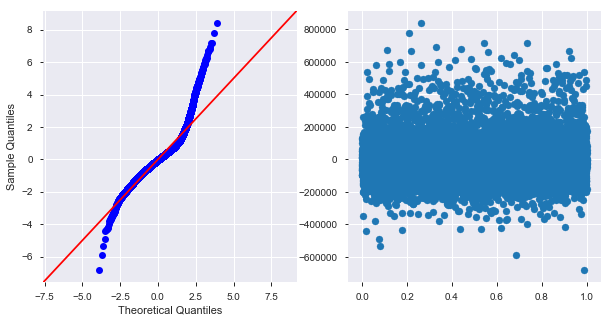

In [19]:
model2 = make_ols_f(df)
diagnose_model(model2)

# Explore 2: Multicollinearity with VIF

Definition: when 2 features are more related to each than the target.

> $\large V.I.F. = \frac{1}{(1 - R^2)} $<br>
- [VIF (Variance Inflation Factor)](https://etav.github.io/python/vif_factor_python.html) 
- [Wikipedia: VIF](https://en.wikipedia.org/wiki/Variance_inflation_factor)

In [20]:
fs.ihelp(fs.ds.list2df)

------------------------------------------------------------------------------------
------ HELP ------------------------------------------------------------------------

Help on function list2df in module fsds_100719.ds:

list2df(list, index_col=None, caption=None, return_df=True, df_kwds={})
    Quick turn an appened list with a header (row[0]) into a pretty dataframe.
        
        Args
            list (list of lists):
            index_col (string): name of column to set as index; None (Default) has integer index.
            set_caption (string):
            show_and_return (bool):
    
    EXAMPLE USE:
    >> list_results = [["Test","N","p-val"]] 
    
    # ... run test and append list of result values ...
    
    >> list_results.append([test_Name,length(data),p])
    
    ## Displays styled dataframe if caption:
    >> df = list2df(list_results, index_col="Test",
                     set_caption="Stat Test for Significance")

-----------------------------------------------

```python
def list2df(list, index_col=None, caption=None, return_df=True,df_kwds={}): #, sort_values='index'):  
    """ Quick turn an appened list with a header (row[0]) into a pretty dataframe.
        
        Args
            list (list of lists):
            index_col (string): name of column to set as index; None (Default) has integer index.
            set_caption (string):
            show_and_return (bool):
    
    EXAMPLE USE:
    >> list_results = [["Test","N","p-val"]] 
    
    # ... run test and append list of result values ...
    
    >> list_results.append([test_Name,length(data),p])
    
    ## Displays styled dataframe if caption:
    >> df = list2df(list_results, index_col="Test",
                     set_caption="Stat Test for Significance")
    """
    from IPython.display import display
    import pandas as pd
    df_list = pd.DataFrame(list[1:],columns=list[0],**df_kwds)
    
        
    if index_col is not None:
        df_list.reset_index(inplace=True)
        df_list.set_index(index_col, inplace=True)
        
    if caption is not None:
        dfs = df_list.style.set_caption(caption)
        display(dfs)
    return df_list

```

In [21]:

def vif_ols(df,exclude_col = None, cat_cols = ['grade','zipcode']):
    # let's check each column, build a model and get the r2
    vif_scores = [['Column','VIF','R2']]

    if exclude_col is not None:
        df = df.drop(exclude_col,axis=1)
        
    for column in df.columns:
        columns_to_use = df.drop(columns=[column]).columns
        target = column
        linreg = make_ols_f(df, target=target, cat_cols=cat_cols,
                            col_list=columns_to_use,show_summary=False)
        R2 = linreg.rsquared
        VIF = 1 / (1 - R2)
    #     print(f"VIF for {column} = {VIF}")
        vif_scores.append([column, VIF, R2])

    res = fs.ds.list2df(vif_scores,index_col='Column')
    res.sort_values('VIF',ascending=False,inplace=True)
    res['use']=res['VIF'] <5
    return res

res = vif_ols(df,exclude_col='price',)
res

,index,VIF,R2,use
Column,,,,
sqft_living,2,112.818,0.991,False
sqft_above,8,101.506,0.990,False
lat,13,71.586,0.986,False
long,14,55.830,0.982,False
sqft_basement,9,30.479,0.967,False
sqft_lot15,16,3.403,0.706,True
grade,7,3.290,0.696,True
sqft_living15,15,3.177,0.685,True
bathrooms,1,3.176,0.685,True


In [22]:
res2 = vif_ols(df,exclude_col=['price','sqft_above'])

In [23]:
vif_scores = [['Column','VIF','R2']]
model_target= 'price'

for col in df.drop(model_target,axis=1).columns:
    
    columns_to_use = df.drop(columns=[col]).columns
    
    target=col
#     cat_cols = 
    linreg = make_ols_f(df,target,show_summary=False)
    R2 = linreg.rsquared
    
    VIF = 1/ (1-R2)
    
    vif_scores.append([col,VIF,R2])
    
res = fs.ds.list2df(vif_scores,index_col='Column')
res.sort_values('VIF',ascending=False,inplace=True)
res['use']=res['VIF'] <5
res

,index,VIF,R2,use
Column,,,,
sqft_living,2,113.094,0.991,False
sqft_above,8,101.648,0.990,False
lat,13,71.593,0.986,False
long,14,55.882,0.982,False
sqft_basement,9,30.484,0.967,False
grade,7,3.599,0.722,True
sqft_lot15,16,3.408,0.707,True
sqft_living15,15,3.226,0.690,True
bathrooms,1,3.200,0.687,True


(<Figure size 1152x1152 with 2 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x12c9a4860>)

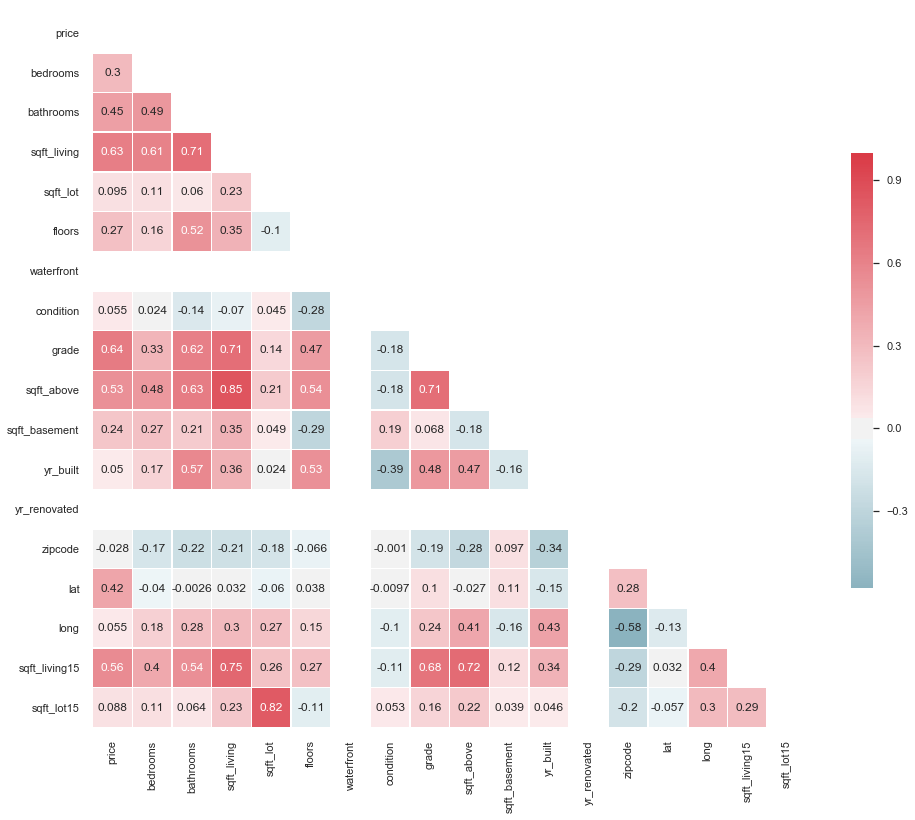

In [24]:
# sns.heatmap(df.corr())
fs.jmi.multiplot(df)

In [25]:
res[res['use']]

,index,VIF,R2,use
Column,,,,
grade,7,3.599,0.722,True
sqft_lot15,16,3.408,0.707,True
sqft_living15,15,3.226,0.690,True
bathrooms,1,3.200,0.687,True
yr_built,10,3.159,0.683,True
sqft_lot,3,3.107,0.678,True
floors,4,2.665,0.625,True
bedrooms,0,1.811,0.448,True
zipcode,12,1.703,0.413,True


In [26]:
df_use = df[res[res['use']].index]
df_use['price'] = df['price'].copy()

# Final Interpretations/Conclusions

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.801
Model:                            OLS   Adj. R-squared:                  0.800
Method:                 Least Squares   F-statistic:                     932.8
Date:                Thu, 12 Dec 2019   Prob (F-statistic):               0.00
Time:                        14:32:29   Log-Likelihood:            -2.5060e+05
No. Observations:               19277   AIC:                         5.014e+05
Df Residuals:                   19193   BIC:                         5.020e+05
Df Model:                          83                                         
Covariance Type:            nonrobust                                         
=======================================================================================
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
Intercept            1.531e+06   9.22e+04     16.605      0.000    1.35e+06    1.71e+06
C(grade)[T.6]        2.425e+04   7988.331      3.035      0.002    8590.678    3.99e+04
C(grade)[T.7]        5.923e+04   7862.183      7.533      0.000    4.38e+04    7.46e+04
C(grade)[T.8]        1.191e+05   8189.587     14.537      0.000    1.03e+05    1.35e+05
C(grade)[T.9]        2.438e+05   8706.820     28.005      0.000    2.27e+05    2.61e+05
C(grade)[T.10]       3.586e+05   9495.582     37.769      0.000     3.4e+05    3.77e+05
C(grade)[T.11]       4.826e+05   1.27e+04     37.872      0.000    4.58e+05    5.08e+05
C(zipcode)[T.98002]  1.626e+04   9688.673      1.678      0.093   -2735.481    3.52e+04
C(zipcode)[T.98003] -2218.5780   8675.740     -0.256      0.798   -1.92e+04    1.48e+04
C(zipcode)[T.98004]  5.726e+05   9509.711     60.207      0.000    5.54e+05    5.91e+05
C(zipcode)[T.98005]  2.979e+05   1.07e+04     27.757      0.000    2.77e+05    3.19e+05
C(zipcode)[T.98006]  2.564e+05   7996.726     32.057      0.000    2.41e+05    2.72e+05
C(zipcode)[T.98007]   2.27e+05    1.1e+04     20.704      0.000    2.05e+05    2.48e+05
C(zipcode)[T.98008]  2.378e+05   8778.129     27.095      0.000    2.21e+05    2.55e+05
C(zipcode)[T.98010]  8.514e+04    1.4e+04      6.071      0.000    5.77e+04    1.13e+05
C(zipcode)[T.98011]  1.326e+05   9733.982     13.619      0.000    1.13e+05    1.52e+05
C(zipcode)[T.98014]  1.316e+05    1.4e+04      9.427      0.000    1.04e+05    1.59e+05
C(zipcode)[T.98019]  9.931e+04   1.03e+04      9.659      0.000    7.92e+04    1.19e+05
C(zipcode)[T.98022]  1.269e+04   1.01e+04      1.261      0.207   -7033.445    3.24e+04
C(zipcode)[T.98023]   -2.9e+04   7532.585     -3.850      0.000   -4.38e+04   -1.42e+04
C(zipcode)[T.98024]   1.43e+05   1.73e+04      8.278      0.000    1.09e+05    1.77e+05
C(zipcode)[T.98027]  1.774e+05   8149.074     21.775      0.000    1.61e+05    1.93e+05
C(zipcode)[T.98028]  1.308e+05   8657.403     15.104      0.000    1.14e+05    1.48e+05
C(zipcode)[T.98029]  2.032e+05   8442.351     24.064      0.000    1.87e+05     2.2e+05
C(zipcode)[T.98030]  1446.7397   8877.186      0.163      0.871    -1.6e+04    1.88e+04
C(zipcode)[T.98031]  2871.6920   8703.382      0.330      0.741   -1.42e+04    1.99e+04
C(zipcode)[T.98032] -4073.7408   1.13e+04     -0.360      0.719   -2.63e+04    1.81e+04
C(zipcode)[T.98033]  3.409e+05   7956.745     42.847      0.000    3.25e+05    3.57e+05
C(zipcode)[T.98034]  1.815e+05   7425.785     24.446      0.000    1.67e+05    1.96e+05
C(zipcode)[T.98038]  3.363e+04   7399.672      4.545      0.000    1.91e+04    4.81e+04
C(zipcode)[T.98039]  7.673e+05   2.83e+04     27.069      0.000    7.12e+05    8.23e+05
C(zipcode)[T.98040]  4.437e+05   9682.988     45.822      0.000    4.25e+05    4.63e+05
C(z

(<Figure size 720x360 with 2 Axes>,
 array([<matplotlib.axes._subplots.AxesSubplot object at 0x12ccf0c50>,
       dtype=object))

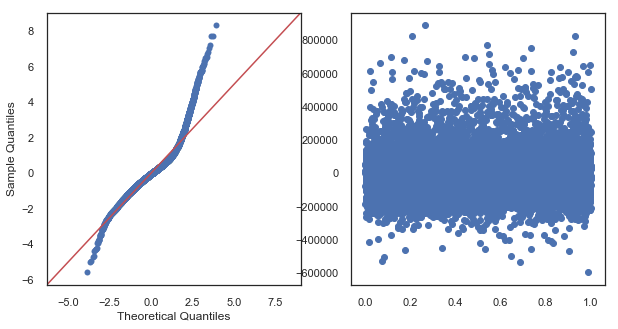

In [27]:
model3 = make_ols_f(df_use)
diagnose_model(model3)

In [28]:
res2 = vif_ols(df,exclude_col=['price','sqft_above'])
df_use2 = df[res2[res2['use']].index]
df_use2['price'] = df['price'].copy()

In [29]:
df_use2

,sqft_lot15,grade,sqft_living15,bathrooms,yr_built,sqft_lot,floors,sqft_basement,bedrooms,zipcode,condition,price
0,5650,7,1340,1.00,1955,5650,1.0,0.0,3,98178,3,221900.0
2,8062,6,2720,1.00,1933,10000,1.0,0.0,2,98028,3,180000.0
3,5000,7,1360,3.00,1965,5000,1.0,910.0,4,98136,5,604000.0
4,7503,8,1800,2.00,1987,8080,1.0,0.0,3,98074,3,510000.0
6,6819,7,2238,2.25,1995,6819,2.0,0.0,3,98003,3,257500.0
...,...,...,...,...,...,...,...,...,...,...,...,...
21592,1509,8,1530,2.50,2009,1131,3.0,0.0,3,98103,3,360000.0
21593,7200,8,1830,2.50,2014,5813,2.0,0.0,4,98146,3,400000.0
21594,2007,7,1020,0.75,2009,1350,2.0,0.0,2,98144,3,402101.0
21595,1287,8,1410,2.50,2004,2388,2.0,0.0,3,98027,3,400000.0


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.803
Model:                            OLS   Adj. R-squared:                  0.802
Method:                 Least Squares   F-statistic:                     928.5
Date:                Thu, 12 Dec 2019   Prob (F-statistic):               0.00
Time:                        14:32:35   Log-Likelihood:            -2.5054e+05
No. Observations:               19277   AIC:                         5.013e+05
Df Residuals:                   19192   BIC:                         5.019e+05
Df Model:                          84                                         
Covariance Type:            nonrobust                                         
=======================================================================================
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
Intercept            1.545e+06   9.19e+04     16.803      0.000    1.36e+06    1.72e+06
C(grade)[T.6]        2.415e+04   7964.782      3.032      0.002    8539.120    3.98e+04
C(grade)[T.7]        5.745e+04   7840.758      7.327      0.000    4.21e+04    7.28e+04
C(grade)[T.8]        1.167e+05   8168.398     14.287      0.000    1.01e+05    1.33e+05
C(grade)[T.9]        2.434e+05   8681.262     28.032      0.000    2.26e+05     2.6e+05
C(grade)[T.10]       3.584e+05   9467.602     37.859      0.000     3.4e+05    3.77e+05
C(grade)[T.11]       4.832e+05   1.27e+04     38.033      0.000    4.58e+05    5.08e+05
C(zipcode)[T.98002]   1.68e+04   9660.241      1.740      0.082   -2130.419    3.57e+04
C(zipcode)[T.98003] -2522.0388   8650.205     -0.292      0.771   -1.95e+04    1.44e+04
C(zipcode)[T.98004]  5.702e+05   9484.236     60.120      0.000    5.52e+05    5.89e+05
C(zipcode)[T.98005]  2.966e+05   1.07e+04     27.708      0.000    2.76e+05    3.18e+05
C(zipcode)[T.98006]  2.521e+05   7982.907     31.583      0.000    2.36e+05    2.68e+05
C(zipcode)[T.98007]  2.267e+05   1.09e+04     20.738      0.000    2.05e+05    2.48e+05
C(zipcode)[T.98008]  2.365e+05   8753.177     27.016      0.000    2.19e+05    2.54e+05
C(zipcode)[T.98010]  8.478e+04    1.4e+04      6.064      0.000    5.74e+04    1.12e+05
C(zipcode)[T.98011]  1.311e+05   9706.274     13.504      0.000    1.12e+05     1.5e+05
C(zipcode)[T.98014]  1.323e+05   1.39e+04      9.506      0.000    1.05e+05     1.6e+05
C(zipcode)[T.98019]      1e+05   1.03e+04      9.758      0.000    7.99e+04     1.2e+05
C(zipcode)[T.98022]  1.506e+04      1e+04      1.501      0.133   -4608.531    3.47e+04
C(zipcode)[T.98023] -3.021e+04   7511.214     -4.021      0.000   -4.49e+04   -1.55e+04
C(zipcode)[T.98024]  1.435e+05   1.72e+04      8.331      0.000     1.1e+05    1.77e+05
C(zipcode)[T.98027]  1.736e+05   8132.809     21.351      0.000    1.58e+05     1.9e+05
C(zipcode)[T.98028]  1.288e+05   8633.770     14.921      0.000    1.12e+05    1.46e+05
C(zipcode)[T.98029]  2.036e+05   8417.549     24.185      0.000    1.87e+05     2.2e+05
C(zipcode)[T.98030]  2081.2856   8851.210      0.235      0.814   -1.53e+04    1.94e+04
C(zipcode)[T.98031]  3212.4059   8677.778      0.370      0.711   -1.38e+04    2.02e+04
C(zipcode)[T.98032] -7032.4712   1.13e+04     -0.622      0.534   -2.92e+04    1.51e+04
C(zipcode)[T.98033]  3.399e+05   7933.914     42.836      0.000    3.24e+05    3.55e+05
C(zipcode)[T.98034]    1.8e+05   7405.330     24.302      0.000    1.65e+05    1.94e+05
C(zipcode)[T.98038]  3.588e+04   7380.842      4.862      0.000    2.14e+04    5.04e+04
C(zipcode)[T.98039]  7.663e+05   2.83e+04     27.114      0.000    7.11e+05    8.22e+05
C(zipcode)[T.98040]  4.419e+05   9655.859     45.767      0.000    4.23e+05    4.61e+05
C(z

(<Figure size 720x360 with 2 Axes>,
 array([<matplotlib.axes._subplots.AxesSubplot object at 0x12d276518>,
       dtype=object))

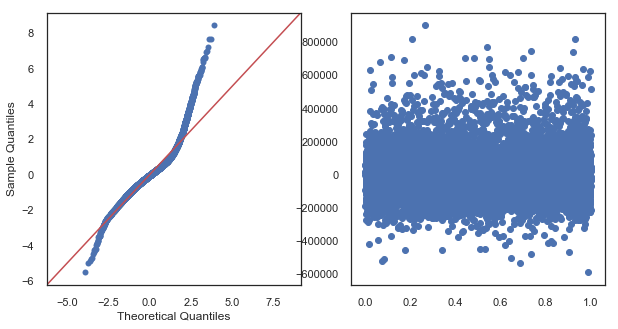

In [30]:
model4 = make_ols_f(df_use2)#,exclude_cols=['floors','lat','waterfront'])
diagnose_model(model4)

# Logging Vars 

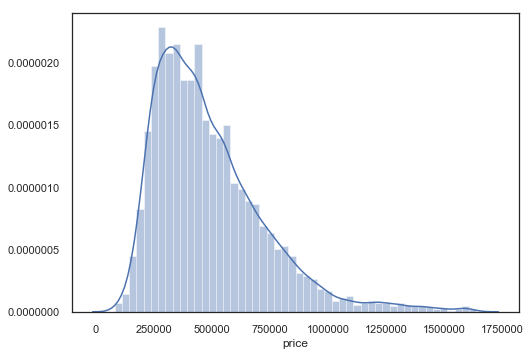

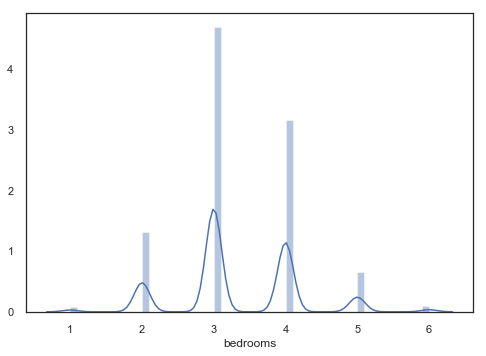

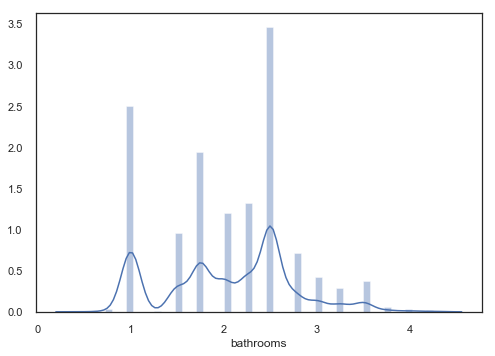

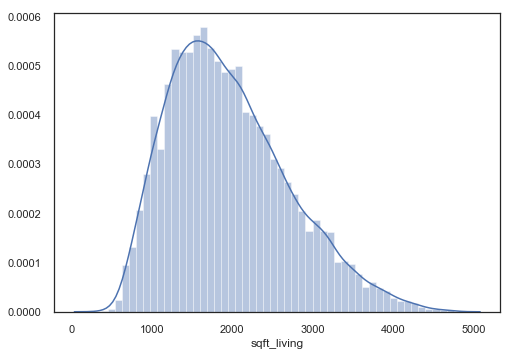

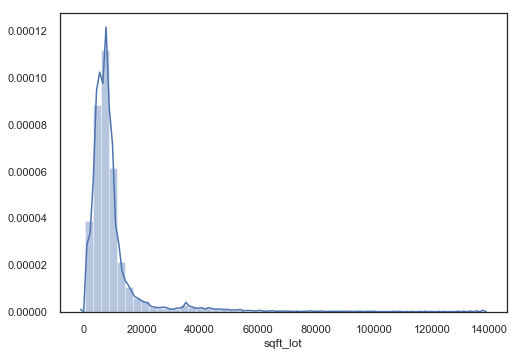

...

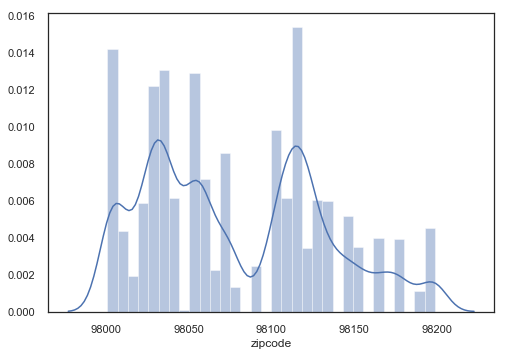

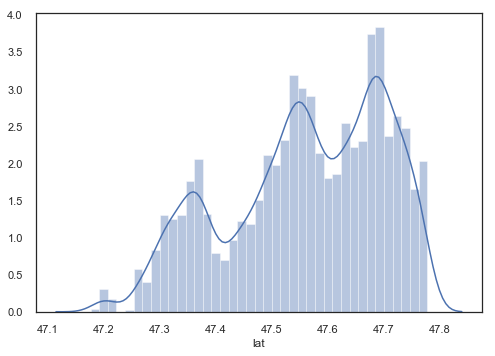

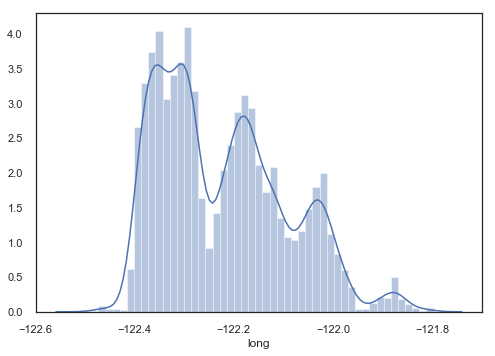

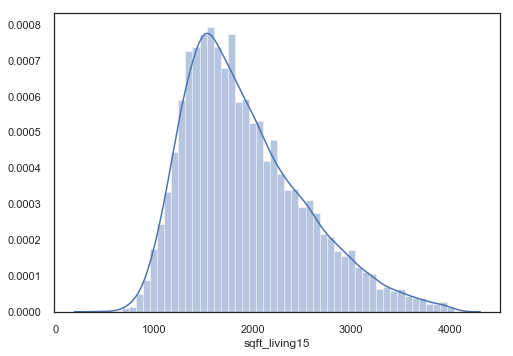

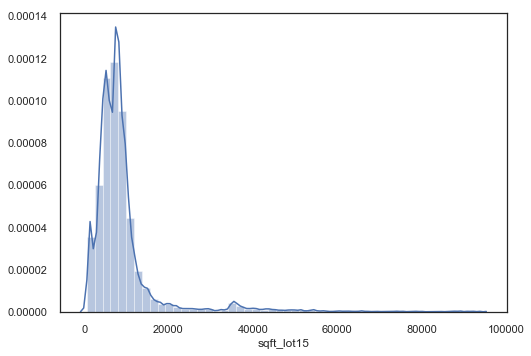

In [31]:
def check_normality(df,col):
    
    sns.distplot(df[col])
    plt.show()
    
    stat,p = stats.normaltest(df[col])
    
    return p

p_list = [['Column','Pval']]
for col in df.columns:
    p_list.append([col,check_normality(df,col)])
    
p_list = fs.ds.list2df(p_list)
p_list['reject'] = p_list['Pval']<0.05


In [32]:
log_list=['price','sqft_living15','sqft_lot','sqft_lot15']
for col in log_list:
    df[col+'_log'] = np.log(df[col])
df.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,price_log,sqft_living15_log,sqft_lot_log,sqft_lot15_log
0,221900.0,3,1.00,1180,5650,1.0,0.0,3,7,1180,0.0,1955,0.0,98178,47.511,-122.257,1340,5650,12.310,7.200,8.639,8.639
2,180000.0,2,1.00,770,10000,1.0,0.0,3,6,770,0.0,1933,0.0,98028,47.738,-122.233,2720,8062,12.101,7.908,9.210,8.995
3,604000.0,4,3.00,1960,5000,1.0,0.0,5,7,1050,910.0,1965,0.0,98136,47.521,-122.393,1360,5000,13.311,7.215,8.517,8.517
4,510000.0,3,2.00,1680,8080,1.0,0.0,3,8,1680,0.0,1987,0.0,98074,47.617,-122.045,1800,7503,13.142,7.496,8.997,8.923
6,257500.0,3,2.25,1715,6819,2.0,0.0,3,7,1715,0.0,1995,0.0,98003,47.310,-122.327,2238,6819,12.459,7.713,8.827,8.827


In [33]:
df_logged = df.copy()
df_logged.drop(log_list,axis=1,inplace=True)

In [34]:
df_logged.describe()

,bedrooms,bathrooms,sqft_living,floors,waterfront,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,price_log,sqft_living15_log,sqft_lot_log,sqft_lot15_log
count,19277.000,19277.000,19277.000,19277.000,19277.0,19277.000,19277.000,19277.000,19277.000,19277.000,19277.0,19277.000,19277.000,19277.000,19277.000,19277.000,19277.000,19277.000
mean,3.329,2.048,1965.985,1.482,0.0,3.424,7.556,1701.464,258.951,1971.462,0.0,98078.982,47.561,-122.222,12.991,7.515,8.878,8.861
std,0.850,0.691,746.519,0.541,0.0,0.648,1.037,708.365,392.312,29.058,0.0,53.618,0.140,0.129,0.467,0.307,0.758,0.683
min,1.000,0.500,370.000,1.000,0.0,2.000,5.000,370.000,0.000,1900.000,0.0,98001.000,47.176,-122.502,11.314,6.131,6.254,6.479
25%,3.000,1.500,1400.000,1.000,0.0,3.000,7.000,1170.000,0.000,1952.000,0.0,98033.000,47.469,-122.331,12.660,7.293,8.517,8.517
50%,3.000,2.250,1852.000,1.000,0.0,3.000,7.000,1510.000,0.000,1975.000,0.0,98072.000,47.572,-122.240,12.987,7.496,8.906,8.916
75%,4.000,2.500,2430.000,2.000,0.0,4.000,8.000,2100.000,500.000,1997.000,0.0,98118.000,47.681,-122.135,13.316,7.732,9.204,9.170
max,6.000,4.250,4750.000,3.000,0.0,5.000,11.000,4270.000,1600.000,2015.000,0.0,98199.000,47.778,-121.797,14.310,8.304,11.829,11.449


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              price_log   R-squared:                       0.860
Model:                            OLS   Adj. R-squared:                  0.859
Method:                 Least Squares   F-statistic:                     1338.
Date:                Thu, 12 Dec 2019   Prob (F-statistic):               0.00
Time:                        14:32:41   Log-Likelihood:                 6257.2
No. Observations:               19277   AIC:                        -1.234e+04
Df Residuals:                   19188   BIC:                        -1.164e+04
Df Model:                          88                                         
Covariance Type:            nonrobust                                         
=======================================================================================
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
Intercept             -54.3969      9.184     -5.923      0.000     -72.399     -36.395
C(grade)[T.6]           0.1192      0.013      9.124      0.000       0.094       0.145
C(grade)[T.7]           0.2272      0.013     17.597      0.000       0.202       0.252
C(grade)[T.8]           0.3188      0.014     23.567      0.000       0.292       0.345
C(grade)[T.9]           0.4193      0.015     28.826      0.000       0.391       0.448
C(grade)[T.10]          0.4591      0.016     28.635      0.000       0.428       0.490
C(grade)[T.11]          0.5337      0.021     25.077      0.000       0.492       0.575
C(zipcode)[T.98002]     0.0225      0.016      1.370      0.171      -0.010       0.055
C(zipcode)[T.98003]     0.0060      0.014      0.415      0.678      -0.022       0.034
C(zipcode)[T.98004]     0.9639      0.029     33.348      0.000       0.907       1.021
C(zipcode)[T.98005]     0.6320      0.031     20.709      0.000       0.572       0.692
C(zipcode)[T.98006]     0.5795      0.026     22.575      0.000       0.529       0.630
C(zipcode)[T.98007]     0.5661      0.032     17.927      0.000       0.504       0.628
C(zipcode)[T.98008]     0.5864      0.031     19.067      0.000       0.526       0.647
C(zipcode)[T.98010]     0.3165      0.030     10.605      0.000       0.258       0.375
C(zipcode)[T.98011]     0.2829      0.039      7.341      0.000       0.207       0.358
C(zipcode)[T.98014]     0.3557      0.046      7.693      0.000       0.265       0.446
C(zipcode)[T.98019]     0.2557      0.045      5.655      0.000       0.167       0.344
C(zipcode)[T.98022]     0.1875      0.026      7.148      0.000       0.136       0.239
C(zipcode)[T.98023]    -0.0641      0.014     -4.565      0.000      -0.092      -0.037
C(zipcode)[T.98024]     0.4463      0.045      9.939      0.000       0.358       0.534
C(zipcode)[T.98027]     0.5219      0.028     18.646      0.000       0.467       0.577
C(zipcode)[T.98028]     0.2421      0.037      6.523      0.000       0.169       0.315
C(zipcode)[T.98029]     0.5975      0.032     18.554      0.000       0.534       0.661
C(zipcode)[T.98030]     0.0537      0.017      3.248      0.001       0.021       0.086
C(zipcode)[T.98031]     0.0599      0.017      3.446      0.001       0.026       0.094
C(zipcode)[T.98032]    -0.0508      0.019     -2.653      0.008      -0.088      -0.013
C(zipcode)[T.98033]     0.6467      0.032     19.902      0.000       0.583       0.710
C(zipcode)[T.98034]     0.3906      0.035     11.287      0.000       0.323       0.458
C(zipcode)[T.98038]     0.2216      0.022     10.052      0.000       0.178       0.265
C(zipcode)[T.98039]     1.1196      0.053     21.314      0.000       1.017       1.223
C(zipcode)[T.98040]     0.7773      0.025     30.667      0.000       0.728       0.827
C(z

(<Figure size 720x360 with 2 Axes>,
 array([<matplotlib.axes._subplots.AxesSubplot object at 0x12c3115c0>,
       dtype=object))

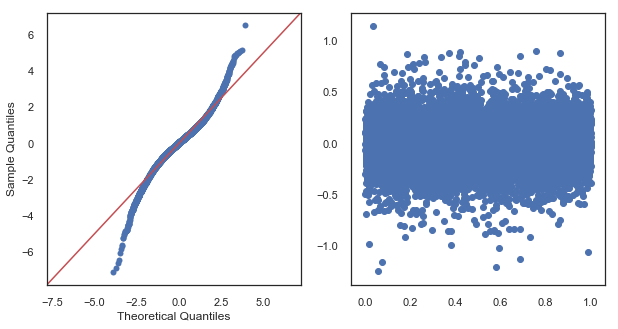

In [35]:
model5 = make_ols_f(df_logged,target='price_log')#,exclude_cols=['sqft_basement',
#                                                        'yr_built'])
diagnose_model(model5)

# Scaling

In [109]:
df.describe()

,sqft_lot15,grade,sqft_living15,bathrooms,yr_built,sqft_lot,floors,sqft_basement,bedrooms,zipcode,condition,price,price_log,sqft_living15_log,sqft_lot_log,sqft_lot15_log
count,19277.000,19277.000,19277.000,19277.000,19277.000,19277.000,19277.000,19277.000,19277.000,19277.000,19277.000,1.928e+04,19277.000,19277.000,19277.000,19277.000
mean,9104.998,7.556,1923.769,2.048,1971.462,9886.432,1.482,258.951,3.329,98078.982,3.424,4.893e+05,12.991,7.515,8.878,8.861
std,8958.255,1.037,605.730,0.691,29.058,11489.925,0.541,392.312,0.850,53.618,0.648,2.402e+05,0.467,0.307,0.758,0.683
min,651.000,5.000,460.000,0.500,1900.000,520.000,1.000,0.000,1.000,98001.000,2.000,8.200e+04,11.314,6.131,6.254,6.479
25%,5000.000,7.000,1470.000,1.500,1952.000,5000.000,1.000,0.000,3.000,98033.000,3.000,3.150e+05,12.660,7.293,8.517,8.517
50%,7453.000,7.000,1800.000,2.250,1975.000,7378.000,1.000,0.000,3.000,98072.000,3.000,4.365e+05,12.987,7.496,8.906,8.916
75%,9608.000,8.000,2280.000,2.500,1997.000,9933.000,2.000,500.000,4.000,98118.000,4.000,6.070e+05,13.316,7.732,9.204,9.170
max,93825.000,11.000,4042.000,4.250,2015.000,137214.000,3.000,1600.000,6.000,98199.000,5.000,1.640e+06,14.310,8.304,11.829,11.449


In [128]:
# cat_cols = ['zipcode','grade']
# cat_cols.extend([''])
df = df_logged.copy()

In [129]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler
# df_minmax = 
cat_cols = ['zipcode','grade']
cols_to_drop =cat_cols

cols_to_drop.append('price_log')
cols_to_scale = df.drop(cols_to_drop,axis=1).columns
# cols_to


scaler = MinMaxScaler()
minmax_data = scaler.fit_transform(df[cols_to_scale])

df_minmax = pd.DataFrame(minmax_data,columns=cols_to_scale)
df_minmax['price_log'] = df['price_log'].copy()
df_minmax['zipcode']= df['zipcode']
df_minmax['grade']= df['grade']

df_minmax.describe()

,bathrooms,yr_built,floors,sqft_basement,bedrooms,condition,sqft_living15_log,sqft_lot_log,sqft_lot15_log,price_log,zipcode,grade
count,19277.000,19277.000,19277.000,19277.000,19277.000,19277.000,19277.000,19277.000,19277.000,17172.000,17172.000,17172.000
mean,0.413,0.621,0.241,0.162,0.466,0.475,0.637,0.471,0.479,12.980,98079.022,7.494
std,0.184,0.253,0.270,0.245,0.170,0.216,0.141,0.136,0.137,0.472,54.300,1.034
min,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,11.314,98001.000,5.000
25%,0.267,0.452,0.000,0.000,0.400,0.333,0.535,0.406,0.410,12.644,98033.000,7.000
50%,0.467,0.652,0.000,0.000,0.400,0.333,0.628,0.476,0.490,12.979,98072.000,7.000
75%,0.533,0.843,0.500,0.312,0.600,0.667,0.737,0.529,0.542,13.309,98118.000,8.000
max,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,14.310,98199.000,11.000


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              price_log   R-squared:                       0.840
Model:                            OLS   Adj. R-squared:                  0.840
Method:                 Least Squares   F-statistic:                     1203.
Date:                Wed, 11 Dec 2019   Prob (F-statistic):               0.00
Time:                        13:52:31   Log-Likelihood:                 5004.4
No. Observations:               19277   AIC:                            -9839.
Df Residuals:                   19192   BIC:                            -9170.
Df Model:                          84                                         
Covariance Type:            nonrobust                                         
=======================================================================================
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
Intercept              10.5043      0.184     56.947      0.000      10.143      10.866
C(grade)[T.6]           0.1441      0.014     10.345      0.000       0.117       0.171
C(grade)[T.7]           0.2697      0.014     19.619      0.000       0.243       0.297
C(grade)[T.8]           0.3936      0.014     27.434      0.000       0.366       0.422
C(grade)[T.9]           0.5659      0.015     37.180      0.000       0.536       0.596
C(grade)[T.10]          0.6683      0.017     40.387      0.000       0.636       0.701
C(grade)[T.11]          0.7868      0.022     35.610      0.000       0.743       0.830
C(zipcode)[T.98002]     0.0209      0.017      1.235      0.217      -0.012       0.054
C(zipcode)[T.98003]     0.0149      0.015      0.987      0.324      -0.015       0.045
C(zipcode)[T.98004]     1.0369      0.017     62.458      0.000       1.004       1.069
C(zipcode)[T.98005]     0.6954      0.019     37.146      0.000       0.659       0.732
C(zipcode)[T.98006]     0.6170      0.014     44.190      0.000       0.590       0.644
C(zipcode)[T.98007]     0.6173      0.019     32.257      0.000       0.580       0.655
C(zipcode)[T.98008]     0.6404      0.015     41.741      0.000       0.610       0.670
C(zipcode)[T.98010]     0.2332      0.024      9.547      0.000       0.185       0.281
C(zipcode)[T.98011]     0.4369      0.017     25.730      0.000       0.404       0.470
C(zipcode)[T.98014]     0.3812      0.024     15.677      0.000       0.334       0.429
C(zipcode)[T.98019]     0.3244      0.018     18.099      0.000       0.289       0.360
C(zipcode)[T.98022]     0.0491      0.018      2.797      0.005       0.015       0.083
C(zipcode)[T.98023]    -0.0358      0.013     -2.726      0.006      -0.062      -0.010
C(zipcode)[T.98024]     0.4013      0.030     13.371      0.000       0.342       0.460
C(zipcode)[T.98027]     0.5105      0.014     36.000      0.000       0.483       0.538
C(zipcode)[T.98028]     0.4090      0.015     27.075      0.000       0.379       0.439
C(zipcode)[T.98029]     0.5847      0.015     39.490      0.000       0.556       0.614
C(zipcode)[T.98030]     0.0462      0.015      2.985      0.003       0.016       0.077
C(zipcode)[T.98031]     0.0564      0.015      3.717      0.000       0.027       0.086
C(zipcode)[T.98032]    -0.0304      0.020     -1.537      0.124      -0.069       0.008
C(zipcode)[T.98033]     0.7655      0.014     55.097      0.000       0.738       0.793
C(zipcode)[T.98034]     0.5229      0.013     40.321      0.000       0.497       0.548
C(zipcode)[T.98038]     0.1644      0.013     12.733      0.000       0.139       0.190
C(zipcode)[T.98039]     1.2042      0.049     24.368      0.000       1.107       1.301
C(zipcode)[T.98040]     0.8396      0.017     49.708      0.000       0.807       0.873
C(z

(<Figure size 720x360 with 2 Axes>,
 array([<matplotlib.axes._subplots.AxesSubplot object at 0x1315b26a0>,
       dtype=object))

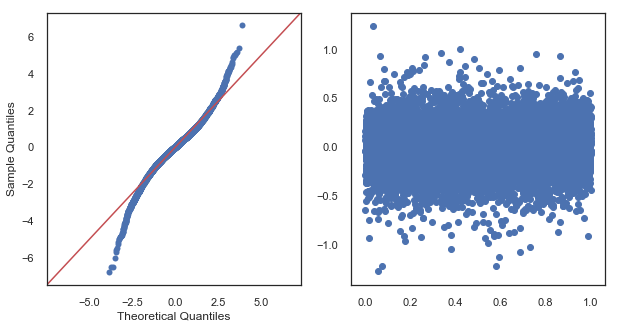

In [134]:
model_default = make_ols_f(df_logged,target='price_log',cat_cols=cat_cols)
diagnose_model(model_default)

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              price_log   R-squared:                       0.769
Model:                            OLS   Adj. R-squared:                  0.768
Method:                 Least Squares   F-statistic:                     676.2
Date:                Wed, 11 Dec 2019   Prob (F-statistic):               0.00
Time:                        13:51:49   Log-Likelihood:                 1101.1
No. Observations:               17172   AIC:                            -2032.
Df Residuals:                   17087   BIC:                            -1373.
Df Model:                          84                                         
Covariance Type:            nonrobust                                         
=========================================================================================
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
Intercept                11.9976      0.023    514.706      0.000      11.952      12.043
C(zipcode)[T.98002.0]    -0.0257      0.022     -1.157      0.247      -0.069       0.018
C(zipcode)[T.98003.0]    -0.0024      0.019     -0.123      0.902      -0.040       0.035
C(zipcode)[T.98004.0]     1.1353      0.021     53.435      0.000       1.094       1.177
C(zipcode)[T.98005.0]     0.8060      0.023     34.592      0.000       0.760       0.852
C(zipcode)[T.98006.0]     0.7036      0.018     39.586      0.000       0.669       0.738
C(zipcode)[T.98007.0]     0.6491      0.024     27.173      0.000       0.602       0.696
C(zipcode)[T.98008.0]     0.6793      0.019     35.129      0.000       0.641       0.717
C(zipcode)[T.98010.0]     0.2988      0.031      9.766      0.000       0.239       0.359
C(zipcode)[T.98011.0]     0.4709      0.022     21.391      0.000       0.428       0.514
C(zipcode)[T.98014.0]     0.4305      0.031     13.987      0.000       0.370       0.491
C(zipcode)[T.98019.0]     0.3726      0.023     15.936      0.000       0.327       0.418
C(zipcode)[T.98022.0]     0.0700      0.022      3.113      0.002       0.026       0.114
C(zipcode)[T.98023.0]    -0.0450      0.017     -2.651      0.008      -0.078      -0.012
C(zipcode)[T.98024.0]     0.4477      0.038     11.930      0.000       0.374       0.521
C(zipcode)[T.98027.0]     0.5902      0.019     30.388      0.000       0.552       0.628
C(zipcode)[T.98028.0]     0.4390      0.020     22.157      0.000       0.400       0.478
C(zipcode)[T.98029.0]     0.5201      0.019     26.861      0.000       0.482       0.558
C(zipcode)[T.98030.0]     0.0504      0.020      2.478      0.013       0.011       0.090
C(zipcode)[T.98031.0]     0.0880      0.019      4.541      0.000       0.050       0.126
C(zipcode)[T.98032.0]    -0.0548      0.025     -2.200      0.028      -0.104      -0.006
C(zipcode)[T.98033.0]     0.7931      0.018     43.948      0.000       0.758       0.828
C(zipcode)[T.98034.0]     0.5238      0.017     31.433      0.000       0.491       0.556
C(zipcode)[T.98038.0]     0.1859      0.017     10.966      0.000       0.153       0.219
C(zipcode)[T.98039.0]     1.3415      0.060     22.263      0.000       1.223       1.460
C(zipcode)[T.98040.0]     0.9618      0.021     45.516      0.000       0.920       1.003
C(zipcode)[T.98042.0]     0.0587      0.017      3.464      0.001       0.025       0.092
C(zipcode)[T.98045.0]     0.4025      0.073      5.496      0.000       0.259       0.546
C(zipcode)[T.98052.0]     0.6330      0.017     37.735      0.000       0.600       0.666
C(zipcode)[T.98053.0]     0.6299      0.019     33.490      0.000       0.593       0.667
C(zipcode)[T.98055.0]     0.1313      0.020      6.566      0.000       0.092       0.170
C(zipcode)[T.98056.0]  

(<Figure size 720x360 with 2 Axes>,
 array([<matplotlib.axes._subplots.AxesSubplot object at 0x13de98c88>,
       dtype=object))

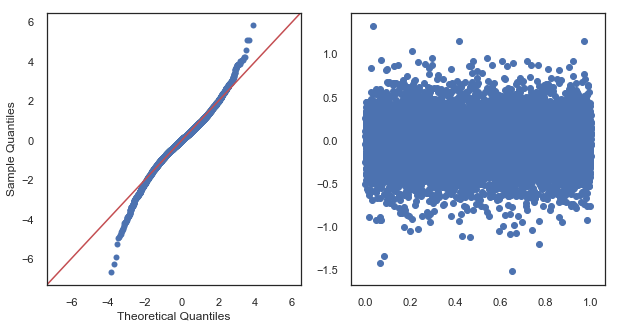

In [130]:
model_minmax = make_ols_f(df_minmax,target='price_log',cat_cols=cat_cols)
diagnose_model(model_minmax)

In [135]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler
# df_minmax = 
cat_cols = ['zipcode','grade']
cols_to_drop =cat_cols

cols_to_drop.append('price_log')
cols_to_scale = df.drop(cols_to_drop,axis=1).columns
# cols_to


scaler = StandardScaler()
scaled_data = scaler.fit_transform(df[cols_to_scale])

df_standard = pd.DataFrame(scaled_data,columns=cols_to_scale)
df_standard['price_log'] = df['price_log'].copy()
df_standard['zipcode']= df['zipcode']
df_standard['grade']= df['grade']

df_standard.describe().round(3)

,bathrooms,yr_built,floors,sqft_basement,bedrooms,condition,sqft_living15_log,sqft_lot_log,sqft_lot15_log,price_log,zipcode,grade
count,19277.000,19277.000,19277.000,19277.000,19277.000,19277.000,19277.000,19277.000,19277.000,17172.000,17172.000,17172.000
mean,0.000,0.000,0.000,0.000,-0.000,-0.000,0.000,0.000,0.000,12.980,98079.022,7.494
std,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,0.472,54.300,1.034
min,-2.240,-2.459,-0.892,-0.660,-2.740,-2.197,-4.502,-3.461,-3.491,11.314,98001.000,5.000
25%,-0.793,-0.670,-0.892,-0.660,-0.387,-0.654,-0.721,-0.476,-0.504,12.644,98033.000,7.000
50%,0.292,0.122,-0.892,-0.660,-0.387,-0.654,-0.062,0.037,0.081,12.979,98072.000,7.000
75%,0.654,0.879,0.958,0.614,0.790,0.890,0.707,0.429,0.453,13.309,98118.000,8.000
max,3.186,1.498,2.808,3.418,3.143,2.433,2.571,3.891,3.791,14.310,98199.000,11.000


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              price_log   R-squared:                       0.769
Model:                            OLS   Adj. R-squared:                  0.768
Method:                 Least Squares   F-statistic:                     676.2
Date:                Wed, 11 Dec 2019   Prob (F-statistic):               0.00
Time:                        13:52:00   Log-Likelihood:                 1101.1
No. Observations:               17172   AIC:                            -2032.
Df Residuals:                   17087   BIC:                            -1373.
Df Model:                          84                                         
Covariance Type:            nonrobust                                         
=========================================================================================
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
Intercept                11.9975      0.021    581.859      0.000      11.957      12.038
C(zipcode)[T.98002.0]    -0.0257      0.022     -1.157      0.247      -0.069       0.018
C(zipcode)[T.98003.0]    -0.0024      0.019     -0.123      0.902      -0.040       0.035
C(zipcode)[T.98004.0]     1.1353      0.021     53.435      0.000       1.094       1.177
C(zipcode)[T.98005.0]     0.8060      0.023     34.592      0.000       0.760       0.852
C(zipcode)[T.98006.0]     0.7036      0.018     39.586      0.000       0.669       0.738
C(zipcode)[T.98007.0]     0.6491      0.024     27.173      0.000       0.602       0.696
C(zipcode)[T.98008.0]     0.6793      0.019     35.129      0.000       0.641       0.717
C(zipcode)[T.98010.0]     0.2988      0.031      9.766      0.000       0.239       0.359
C(zipcode)[T.98011.0]     0.4709      0.022     21.391      0.000       0.428       0.514
C(zipcode)[T.98014.0]     0.4305      0.031     13.987      0.000       0.370       0.491
C(zipcode)[T.98019.0]     0.3726      0.023     15.936      0.000       0.327       0.418
C(zipcode)[T.98022.0]     0.0700      0.022      3.113      0.002       0.026       0.114
C(zipcode)[T.98023.0]    -0.0450      0.017     -2.651      0.008      -0.078      -0.012
C(zipcode)[T.98024.0]     0.4477      0.038     11.930      0.000       0.374       0.521
C(zipcode)[T.98027.0]     0.5902      0.019     30.388      0.000       0.552       0.628
C(zipcode)[T.98028.0]     0.4390      0.020     22.157      0.000       0.400       0.478
C(zipcode)[T.98029.0]     0.5201      0.019     26.861      0.000       0.482       0.558
C(zipcode)[T.98030.0]     0.0504      0.020      2.478      0.013       0.011       0.090
C(zipcode)[T.98031.0]     0.0880      0.019      4.541      0.000       0.050       0.126
C(zipcode)[T.98032.0]    -0.0548      0.025     -2.200      0.028      -0.104      -0.006
C(zipcode)[T.98033.0]     0.7931      0.018     43.948      0.000       0.758       0.828
C(zipcode)[T.98034.0]     0.5238      0.017     31.433      0.000       0.491       0.556
C(zipcode)[T.98038.0]     0.1859      0.017     10.966      0.000       0.153       0.219
C(zipcode)[T.98039.0]     1.3415      0.060     22.263      0.000       1.223       1.460
C(zipcode)[T.98040.0]     0.9618      0.021     45.516      0.000       0.920       1.003
C(zipcode)[T.98042.0]     0.0587      0.017      3.464      0.001       0.025       0.092
C(zipcode)[T.98045.0]     0.4025      0.073      5.496      0.000       0.259       0.546
C(zipcode)[T.98052.0]     0.6330      0.017     37.735      0.000       0.600       0.666
C(zipcode)[T.98053.0]     0.6299      0.019     33.490      0.000       0.593       0.667
C(zipcode)[T.98055.0]     0.1313      0.020      6.566      0.000       0.092       0.170
C(zipcode)[T.98056.0]  

(<Figure size 720x360 with 2 Axes>,
 array([<matplotlib.axes._subplots.AxesSubplot object at 0x13c6e7470>,
       dtype=object))

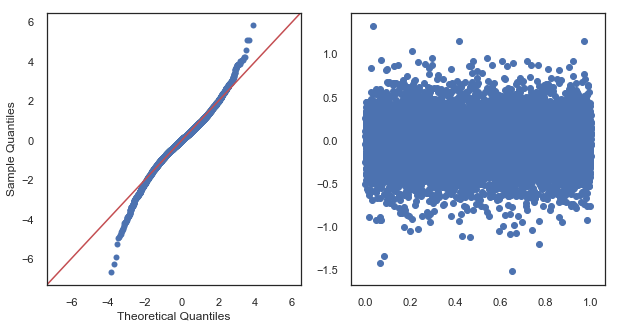

In [132]:
model_standard = make_ols_f(df_standard,target='price_log',cat_cols=cat_cols)
diagnose_model(model_standard)

In [136]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler
# df_minmax = 
cat_cols = ['zipcode','grade']
cols_to_drop =cat_cols

# cols_to_drop.append('price_log')
cols_to_scale = df.drop(cols_to_drop,axis=1).columns
# cols_to


scaler = StandardScaler()
scaled_data = scaler.fit_transform(df[cols_to_scale])

df_standard = pd.DataFrame(scaled_data,columns=cols_to_scale)
# df_standard['price_log'] = df['price_log'].copy()
df_standard['zipcode']= df['zipcode']
df_standard['grade']= df['grade']

df_standard.describe().round(3)

,bathrooms,yr_built,floors,sqft_basement,bedrooms,condition,price_log,sqft_living15_log,sqft_lot_log,sqft_lot15_log,zipcode,grade
count,19277.000,19277.000,19277.000,19277.000,19277.000,19277.000,19277.000,19277.000,19277.000,19277.000,17172.000,17172.000
mean,0.000,0.000,0.000,0.000,-0.000,-0.000,-0.000,0.000,0.000,0.000,98079.022,7.494
std,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,54.300,1.034
min,-2.240,-2.459,-0.892,-0.660,-2.740,-2.197,-3.589,-4.502,-3.461,-3.491,98001.000,5.000
25%,-0.793,-0.670,-0.892,-0.660,-0.387,-0.654,-0.708,-0.721,-0.476,-0.504,98033.000,7.000
50%,0.292,0.122,-0.892,-0.660,-0.387,-0.654,-0.010,-0.062,0.037,0.081,98072.000,7.000
75%,0.654,0.879,0.958,0.614,0.790,0.890,0.696,0.707,0.429,0.453,98118.000,8.000
max,3.186,1.498,2.808,3.418,3.143,2.433,2.823,2.571,3.891,3.791,98199.000,11.000


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              price_log   R-squared:                       0.463
Model:                            OLS   Adj. R-squared:                  0.463
Method:                 Least Squares   F-statistic:                     2079.
Date:                Wed, 11 Dec 2019   Prob (F-statistic):               0.00
Time:                        13:59:54   Log-Likelihood:                -21354.
No. Observations:               19277   AIC:                         4.273e+04
Df Residuals:                   19268   BIC:                         4.280e+04
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
Intercept         -3.133e-15      0.005  -5.94e-13      1.000      -0.010       0.010
bathrooms             0.2434      0.009     27.599      0.000       0.226       0.261
yr_built             -0.3127      0.007    -42.289      0.000      -0.327      -0.298
floors                0.2317      0.008     29.251      0.000       0.216       0.247
sqft_basement         0.1428      0.006     22.092      0.000       0.130       0.155
bedrooms             -0.0228      0.006     -3.547      0.000      -0.035      -0.010
condition             0.0606      0.006     10.324      0.000       0.049       0.072
sqft_living15_log     0.5007      0.007     69.993      0.000       0.487       0.515
sqft_lot15_log       -0.0944      0.007    -14.373      0.000      -0.107      -0.081
==============================================================================
Omnibus:                       16.785   Durbin-Watson:                   1.977
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               18.944
Skew:                          -0.017   Prob(JB):                     7.70e-05
Kurtosis:                       3.150   Cond. No.                         3.41
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

(<Figure size 720x360 with 2 Axes>,
 array([<matplotlib.axes._subplots.AxesSubplot object at 0x13c4e7ba8>,
       dtype=object))

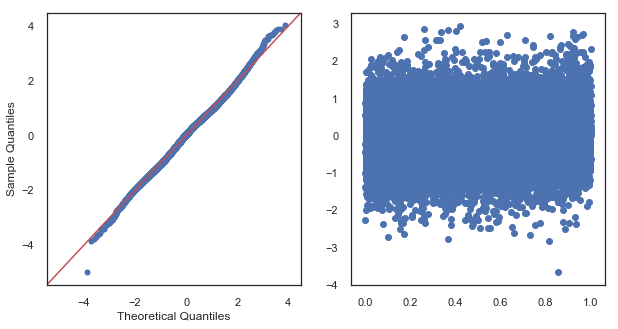

In [139]:
model_standard = make_ols_f(df_standard,target='price_log',
                            exclude_cols=['zipcode','grade','sqft_lot_log'])#cat_cols=cat_cols)
diagnose_model(model_standard)

# Conclusion
- Scaling is not necessarily as helpful as dogma would indicate (at least with statsmodels).
- VIF identified new columns as multicoll that heatmap correlation did not indicate (according to pairwise comparisons). 
- log transformation was indeed helpful (though slightly complicates interpretation)

- IQR outier removal is more potent/liberal than using Z-scores
    - Did not check if IQR outlier removal would have provided better results.
    - We could not apply IQR across the board without removing all of data